# Theory overview


Mask R-CNN is a state of the art model for instance segmentation, developed on top of Faster R-CNN. Faster R-CNN is a region-based convolutional neural networks, that returns bounding boxes for each object and its class label with a confidence score.

## Faster R-CNN

**Stage1:** The first stage consists of two networks, backbone (ResNet, VGG, Inception, etc..) and region proposal network. These networks run once per image to give a set of region proposals. Region proposals are regions in the feature map which contain the object.

**Stage2:** In the second stage, the network predicts bounding boxes and object class for each of the proposed region obtained in stage1. Each proposed region can be of different size whereas fully connected layers in the networks always require fixed size vector to make predictions. Size of these proposed regions is fixed by using either RoI pool (which is very similar to MaxPooling) or RoIAlign method.

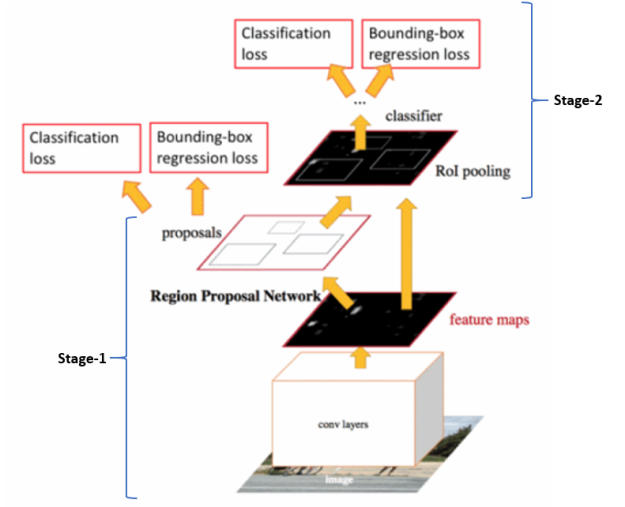

## Mask R-CNN

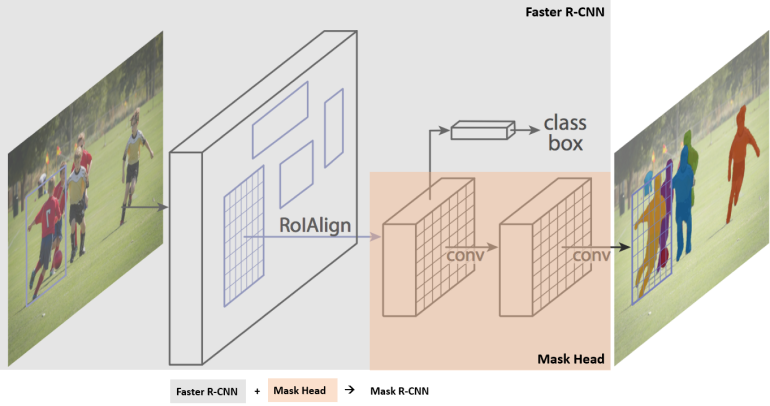

*Note*: **R**egion **o**f **I**nterest **Align**, or RoIAlign, is an operation for extracting a small feature map from each RoI in detection and segmentation based tasks. It removes the harsh quantization of RoI Pool, properly aligning the extracted features with the input.

# Mask R-CNN apply

Importing the libraries for application and good visualization

In [ ]:
import numpy as np
import torch
import torchvision
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import random
import torchvision.transforms as Tv
import cv2
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
print(f'device: {device}')

device: cuda:0


#### Load the model

The model is easy to use, similar to the previous well-known models, this model can also be found among the models of torch vision. To use pre-trained weights, the "weight" parameter is required to set "default" (COCO usually) or special cases.

The model must be set to evaluation mode and transferred to the appropriate device.

The model contains some "special" layer (AnchorGenerator, MultiScaleRoIAlign, )
that prevent common graph visualization tools from visualizing it.

In [ ]:
# version dependent: pretrained=True or weights='DEFAULT' (newer, there are many pretrained weights)
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights='DEFAULT')
# Change to use-only mode for lower memory requirements and faster operation.
model.eval().to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

#### Prediction function

The predict function transforms the image to the right format (tensor) calls the model and lists the prediction that satisfies our criteria (confidence).

In [ ]:
def get_prediction(img_path, confidence,CLASS_NAMES,model):

    img = Image.open(img_path)
    transform = Tv.Compose([Tv.ToTensor()])
    img = transform(img)

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy()) # 0 referes to the batch

    if np.sum(np.array(pred_score)>confidence)==0:
        # no matching class with the defined confidence
        masks = []
        pred_boxes = []
        pred_class = []
    else:
        pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
        masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
        #print([ list(pred[0]['labels'].cpu().numpy())])
        pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
        pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
        masks = masks[:pred_t+1]
        pred_boxes = pred_boxes[:pred_t+1]
        pred_class = pred_class[:pred_t+1]

    return masks, pred_boxes, pred_class

#### Coloring the masks

"get_colored_mask(mask)" randomly chooses a color from our predefined "colors" list

In [ ]:
def get_colored_mask(mask):

    colors = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colors[random.randrange(0,10)]
    colored_mask = np.stack([r, g, b], axis=2)
    return colored_mask

### Visualization of results

segment_instance() connects the previously defined functions and adds visualization to it with the "class_names", "confidence", and "model" applied for the "img_path".

In [ ]:
# Specify the class names to display
CLASS_NAMES91 = ['background', 'person', 'bike', 'auto', 'motorbike', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'hydrant' , 'sign', 'stop sign', 'parking clock', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', ' zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoes', 'glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard' , 'sports ball', 'flying kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hotdog', 'pizza', 'doughnut', 'cake', 'chair ', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'table', 'toilet', 'door', 'tv', 'laptop', 'mouse' , 'remote control', 'keyboard', 'mobile phone', 'microwave oven', 'oven', 'toaster', 'dishwasher', 'refrigerator', 'smoothie', 'book', 'clock', 'vase' , 'scissors', 'teddy bear', 'hair dryer', 'toothbrush', 'comb']

def segment_instance(img_path, CLASS_NAMES=CLASS_NAMES91, model=model, confidence=0.5, rect_th=2, text_size=1, text_th=2):

    masks, boxes, pred_cls = get_prediction(img_path, confidence, CLASS_NAMES, model)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
      rgb_mask = get_colored_mask(masks[i])
      img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)

      #cv2.rectangle and cv2.putText version dipendent
      pt1 = tuple([int(j) for j in boxes[i][0]])
      pt2 = tuple([int(j) for j in boxes[i][1]])
      cv2.rectangle(img, pt1, pt2,color=(0, 255, 0), thickness=rect_th)
      cv2.putText(img,pred_cls[i], pt1, cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()


In [ ]:
# Download an image for test
torch.hub.download_url_to_file('https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/Grosser_Panda.JPG/1200px-Grosser_Panda.JPG', 'panda.jpg')

100%|███████████████████████████████████████████████████████████████████████████████| 239k/239k [00:00<00:00, 1.52MB/s]


An image can be segmented using `segment_instance()`. Its parameters:

- Image path:: './pedestrian.jpg'
- Names of classes: CLASS_NAMES=CLASS_NAMES91
- The segmentation model: model=model
- Reliability: confidence=0.7

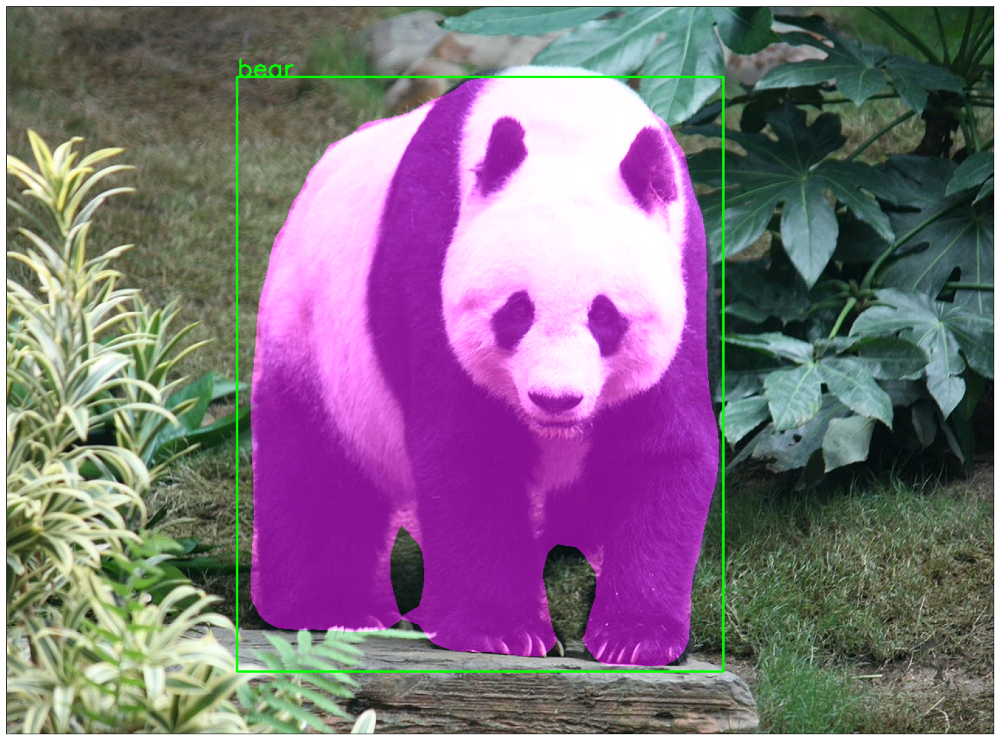

In [ ]:
segment_instance('panda.jpg', CLASS_NAMES=CLASS_NAMES91, model=model, confidence=0.7)

## Fine-tuning **Mask R-CNN** on custom dataset

Further packages for training

In [ ]:
import os
from zipfile import ZipFile
from PIL import Image
import numpy as np
import torch
import torch.utils.data
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import random
import math
import copy

# Download dataset

Training [dataset](https://www.cis.upenn.edu/~jshi/ped_html/) consists of **170** images about **345** instances of pedestrians. Download the dataset, unzip it, and visualize some examples.

In [ ]:
import os
if os.path.isdir('PennFudanPed')==False:
    torch.hub.download_url_to_file('https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip', 'tmp.zip')

In [ ]:
if os.path.isdir('PennFudanPed')==False:
    # loading the tmp.zip and creating a zip object
    with ZipFile("tmp.zip", 'r') as zObject:
        zObject.extractall(path="") # Extracting all the members of the zip into a specific location.

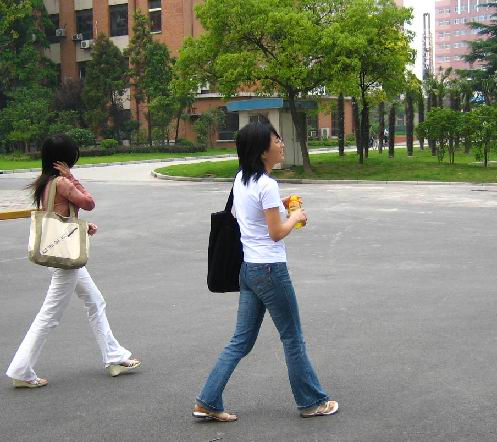

In [ ]:
from PIL import Image
Image.open('PennFudanPed/PNGImages/FudanPed00019.png')

## Masks

Let's look at the mask definitions.

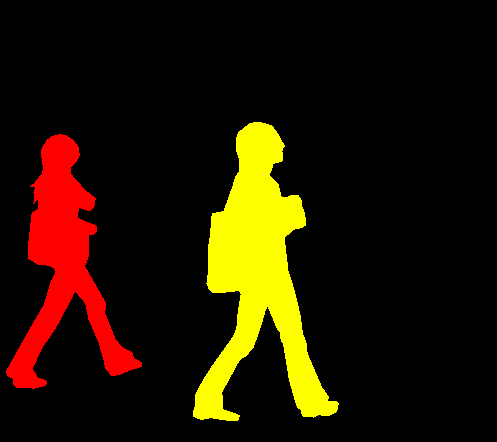

In [ ]:
mask = Image.open('PennFudanPed/PedMasks/FudanPed00019_mask.png').convert("L")
#PIL Image.putpalette mostly work with P or L type only

# on each mask, each object gets an index from 0 to N (N is the number of objects)
mask.putpalette([
    0, 0, 0, # index 0 is black for the background
    255, 0, 0, # index 1 is red
    255, 255, 0, # index 2 is yellow
    255, 153, 0, # index 3 is orange
])
mask

In [ ]:
obj_ids = np.unique(mask)
obj_ids

array([0, 1, 2], dtype=uint8)

### Creating a dataset class

In [ ]:
class PedestrianDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # listing all images and masks
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
    # convert("RGB") to make it work with different image types
        img = Image.open(img_path).convert("RGB")
    # The mask should be te same
        mask = Image.open(mask_path)
        mask = np.array(mask)
    # instances are encoded as different colors
        obj_ids = np.unique(mask)
    # first id is the background, and don't need to segment
        obj_ids = obj_ids[1:]
    # split the mask into a set of binary masks similarly as the one-hot encoding
        masks = mask == obj_ids[:, None, None]


        num_objs = len(obj_ids) # get the number of instance
        # get bounding box coordinates for each mask for box prediction and region proposal nrtwork (RPN)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])


        boxes = torch.as_tensor(boxes, dtype=torch.float32)
    # class labels for each instance, torch.ones() is enough, because there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
    # Can be used for more detailed evaluation to separate small, medium and large objects.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
    # all instances are not crowd, It can be used for more detailed evaluation to differentiate harder-to-segment objects with overlapping areas.
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes # the coordinates of the N bounding boxes in [x0, y0, x1, y1] format, ranging from 0 to W and 0 to H
        target["labels"] = labels # the label for each instance
        target["masks"] = masks # The segmentation masks for each instance
        target["image_id"] = image_id # an image identifier. Can be used for evaluation.
        target["area"] = area # The area of the bounding box.
        target["iscrowd"] = iscrowd # It can be used for more detailed evaluation to differentiate harder-to-segment objects with overlapping areas.
    # transformations of the dataset
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.imgs)

### Transformations
Defining simple transformations to the training images and the targets.

In [ ]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

In [ ]:
class RandomHorizontalFlip(object):
    def __init__(self, prob):
        self.prob = prob

    def __call__(self, image, target):
        if random.random() < self.prob:
            height, width = image.shape[-2:]
            image = image.flip(-1)
            bbox = target["boxes"]
            bbox[:, [0, 2]] = width - bbox[:, [2, 0]]
            target["boxes"] = bbox
            if "masks" in target:
                target["masks"] = target["masks"].flip(-1)
        return image, target

In [ ]:
class ToTensor(object):
    def __call__(self, image, target):
        image = torchvision.transforms.functional.to_tensor(image)
        return image, target

In [ ]:
def get_transform(train):
    transform = []
    # PyTorch Tensor
    transform.append(ToTensor())
    if train:
        # random mirorring
        transform.append(RandomHorizontalFlip(0.5))

    return Compose(transform)

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

### Dataloader

In [ ]:
batch_size=32

# transform the training data
dataset_train = PedestrianDataset('PennFudanPed/', get_transform(train=True)) # always transformed
dataset_val = PedestrianDataset('PennFudanPed/', get_transform(train=False))  # recommended not transform, but can be used for better feedback
dataset_test = PedestrianDataset('PennFudanPed/', get_transform(train=False)) # newer transformed

# dividing data into training, valid. and testing
torch.manual_seed(1) # for repeatability
indices = torch.randperm(len(dataset_train)).tolist()
len_dataset = len(dataset_train)
len_test = len_dataset//6   # ~16%
len_valid = len_dataset//6  # ~16%
len_train=len_dataset-len_test-len_valid #~68%
dataset_test = torch.utils.data.Subset(dataset_test, indices[-len_test:])
dataset_val = torch.utils.data.Subset(dataset_val, indices[-len_test-len_valid:-len_test-1])
dataset_train = torch.utils.data.Subset(dataset_train, indices[:-len_test-len_valid-1])



# loading the data
data_loader_train = DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True, num_workers=0, collate_fn=collate_fn)

data_loader_val = DataLoader(
    dataset_val, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fn)

data_loader_test = DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fn)

### Transfer learning
As we want to fine-tune Mask-RCNN, we need to modify its pre-trained head with a new one. For Mask-RCNN, because it has an object-detecor (box_predictor) and a mask_predictor. So, we need to modify both of them to adapt to our dataset.

In [ ]:
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights='DEFAULT')

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,hidden_layer,num_classes)

    return model

The samples have the background and pedestrian class. Based on this, we modify the original model using the previously defined build_model() function and move it to the appropriate device.

In [ ]:
nc = 2
model = build_model(nc)
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

### Loss function
The loss function is calculated within the model in training mode, we can only determine the weighting of the various losses.
Let's see what kind of losses we have.

In [ ]:
train_loss_dict_t = {}
train_loss_dict_t['loss_classifier']=0
train_loss_dict_t['loss_box_reg']=0
train_loss_dict_t['loss_objectness']=0
train_loss_dict_t['loss_rpn_box_reg']=0

###  Optimizer
Selection of parameters. Set up and schedule optimization.

In [ ]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer =torch.optim.SGD(params,lr=0.005,momentum=0.9, weight_decay=0.0005)
lr_scheduler=torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)

# Train the model

In [ ]:
# number of epochs
num_epochs = 10
hist_train_classifier=[]
hist_valid_classifier=[]
hist_train_box_reg=[]
hist_valid_box_reg=[]
hist_train_objectness=[]
hist_valid_objectness=[]
hist_train_rpn_box_reg=[]
hist_valid_rpn_box_reg=[]

best_loss=float('inf')
best_model_wts = copy.deepcopy(model.state_dict())
early_stop_tolerant_count=0
early_stop_tolerant=10;

for epoch in range(num_epochs):
    model.train()
    train_loss_dict_t = {}
    train_loss_dict_t['loss_classifier']=0
    train_loss_dict_t['loss_box_reg']=0
    train_loss_dict_t['loss_objectness']=0
    train_loss_dict_t['loss_rpn_box_reg']=0
    train_losses_t=0
    for images, targets in data_loader_train:

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        train_loss_dict = model(images, targets)

        train_losses = sum(loss for loss in train_loss_dict.values())
        train_loss_dict_t={x: train_loss_dict_t.get(x, 0) + train_loss_dict.get(x, 0)/len_train*batch_size  for x in set(train_loss_dict)}
        train_losses_t=train_losses_t+train_losses
        optimizer.zero_grad()
        train_losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

    # Validation

    with torch.no_grad():        # model.eval() would give different output
        valid_loss_dict_t = {}
        valid_loss_dict_t['loss_classifier']=0
        valid_loss_dict_t['loss_box_reg']=0
        valid_loss_dict_t['loss_objectness']=0
        valid_loss_dict_t['loss_rpn_box_reg']=0
        valid_losses_t=0
        for images, targets in data_loader_val:

            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            valid_loss_dict = model(images, targets)

            valid_losses = sum(loss for loss in valid_loss_dict.values())
            valid_loss_dict_t={x: valid_loss_dict_t.get(x, 0) + valid_loss_dict.get(x, 0)/len_valid*batch_size  for x in set(valid_loss_dict)}
            valid_losses_t=valid_losses_t+valid_losses
        valid_losses0=valid_losses/len_valid*batch_size
        hist_train_classifier.append(np.array(train_loss_dict_t['loss_classifier'].cpu().detach()))
        hist_valid_classifier.append(np.array(valid_loss_dict_t['loss_classifier'].cpu().detach()))
        hist_train_box_reg.append(np.array(train_loss_dict_t['loss_box_reg'].cpu().detach()))
        hist_valid_box_reg.append(np.array(valid_loss_dict_t['loss_box_reg'].cpu().detach()))
        hist_train_objectness.append(np.array(train_loss_dict_t['loss_objectness'].cpu().detach()))
        hist_valid_objectness.append(np.array(valid_loss_dict_t['loss_objectness'].cpu().detach()))
        hist_train_rpn_box_reg.append(np.array(train_loss_dict_t['loss_rpn_box_reg'].cpu().detach()))
        hist_valid_rpn_box_reg.append(np.array(valid_loss_dict_t['loss_rpn_box_reg'].cpu().detach()))

        # Always save the current best model based on the validation data, and stop the training if no improvements happen after a certain epoch.
        early_stop_tolerant_count=early_stop_tolerant_count+1
        if valid_losses_t < best_loss:
            early_stop_tolerant_count=0
            best_loss = valid_losses_t
            best_model_wts = copy.deepcopy(model.state_dict())
        if early_stop_tolerant_count>=early_stop_tolerant:
            break
        if epoch % 1 != 0:
            continue
        # Display some information along the training
        print("Epoch: ", epoch, ".")
        print("Training losses: ")
        print("Classifier loss: ", format(train_loss_dict_t['loss_classifier'].item(), ".2f"))
        print("Box regression loss: ", format(train_loss_dict_t['loss_box_reg'].item(), ".2f"))
        print("Objectness loss: ", format(train_loss_dict_t['loss_objectness'].item(), ".2f"))
        print("RPN box regression loss: ", format(train_loss_dict_t['loss_rpn_box_reg'].item(), ".2f"))
        print("Validation losses: ")
        print("Classifier loss: ", format(valid_loss_dict_t['loss_classifier'].item(), ".2f"))
        print("Box regression loss: ", format(valid_loss_dict_t['loss_box_reg'].item(), ".2f"))
        print("Objectness loss: ", format(valid_loss_dict_t['loss_objectness'].item(), ".2f"))
        print("RPN box regression loss: ", format(valid_loss_dict_t['loss_rpn_box_reg'].item(), ".2f"))



Epoch:  0 .
Training losses: 
Classifier loss:  0.44
Box regression loss:  0.33
Objectness loss:  0.02
RPN box regression loss:  0.01
Validation losses: 
Classifier loss:  0.23
Box regression loss:  0.34
Objectness loss:  0.01
RPN box regression loss:  0.01
Epoch:  1 .
Training losses: 
Classifier loss:  0.21
Box regression loss:  0.31
Objectness loss:  0.02
RPN box regression loss:  0.01
Validation losses: 
Classifier loss:  0.23
Box regression loss:  0.34
Objectness loss:  0.02
RPN box regression loss:  0.01
Epoch:  2 .
Training losses: 
Classifier loss:  0.20
Box regression loss:  0.30
Objectness loss:  0.02
RPN box regression loss:  0.01
Validation losses: 
Classifier loss:  0.23
Box regression loss:  0.34
Objectness loss:  0.02
RPN box regression loss:  0.01
Epoch:  3 .
Training losses: 
Classifier loss:  0.22
Box regression loss:  0.32
Objectness loss:  0.02
RPN box regression loss:  0.01
Validation losses: 
Classifier loss:  0.23
Box regression loss:  0.34
Objectness loss:  0.02

# Test the Model

In [ ]:
#Test
torch.cuda.empty_cache()
model.load_state_dict(best_model_wts)
with torch.no_grad():        # model.eval() would give different output
    test_loss_dict_t = {}
    test_loss_dict_t['loss_classifier']=0
    test_loss_dict_t['loss_box_reg']=0
    test_loss_dict_t['loss_objectness']=0
    test_loss_dict_t['loss_rpn_box_reg']=0
    test_losses_t=0

    for images, targets in data_loader_test:

            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            test_loss_dict = model(images, targets)

            test_losses = sum(loss for loss in test_loss_dict.values())
            test_loss_dict_t={x: test_loss_dict_t.get(x, 0) + test_loss_dict.get(x, 0)/len_test*batch_size  for x in set(test_loss_dict)}


print("Test losses: ")
print("Classifier loss: ", format(test_loss_dict_t['loss_classifier'].item(), ".2f"))
print("Box regression loss: ", format(test_loss_dict_t['loss_box_reg'].item(), ".2f"))
print("Objectness loss: ", format(test_loss_dict_t['loss_objectness'].item(), ".2f"))
print("RPN box regression loss: ", format(test_loss_dict_t['loss_rpn_box_reg'].item(), ".2f"))

Test losses: 
Classifier loss:  0.17
Box regression loss:  0.26
Objectness loss:  0.01
RPN box regression loss:  0.01


# Save and Load model, weights

In [ ]:
if os.path.isdir('maskrcnn_weights')==False: os.mkdir('maskrcnn_weights')

In [ ]:
torch.save(model, 'maskrcnn_weights/mask-rcnn-pedestrian3.pt')

In [ ]:
torch.save(model.state_dict(), 'maskrcnn_weights/mask-rcnn-pedestrian_weights3.pt')

In [ ]:
model.load_state_dict(torch.load(os.getcwd()+'\maskrcnn_weights\mask-rcnn-pedestrian_weights3.pt'))

<All keys matched successfully>

# Plotting the different losses

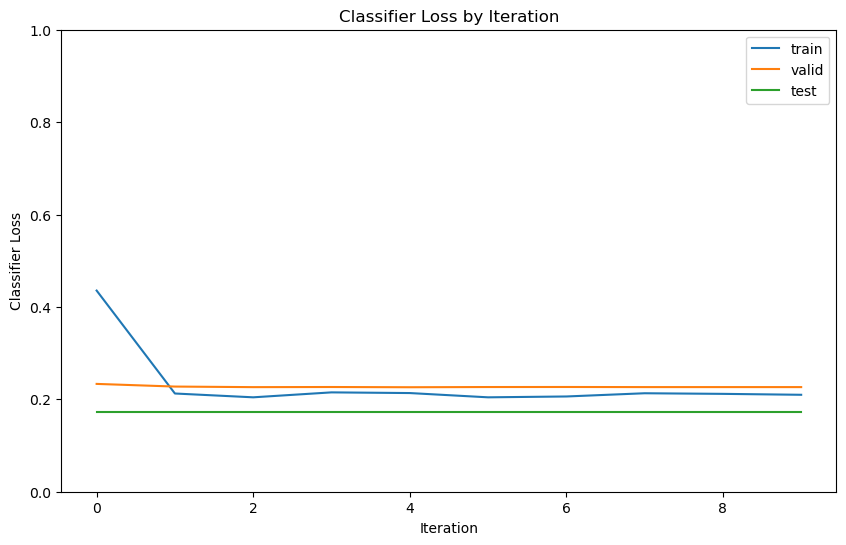

In [ ]:
%matplotlib inline
plt.figure(figsize=(10,6))
plt.xlabel('Iteration')
plt.ylabel('Classifier Loss')
plt.title('Classifier Loss by Iteration')
plt.plot(hist_train_classifier)
plt.plot(hist_valid_classifier)
plt.plot(test_loss_dict_t['loss_classifier'].item()*np.ones(len(hist_valid_classifier)))
plt.ylim((0,1))
plt.legend(['train', 'valid', 'test'])

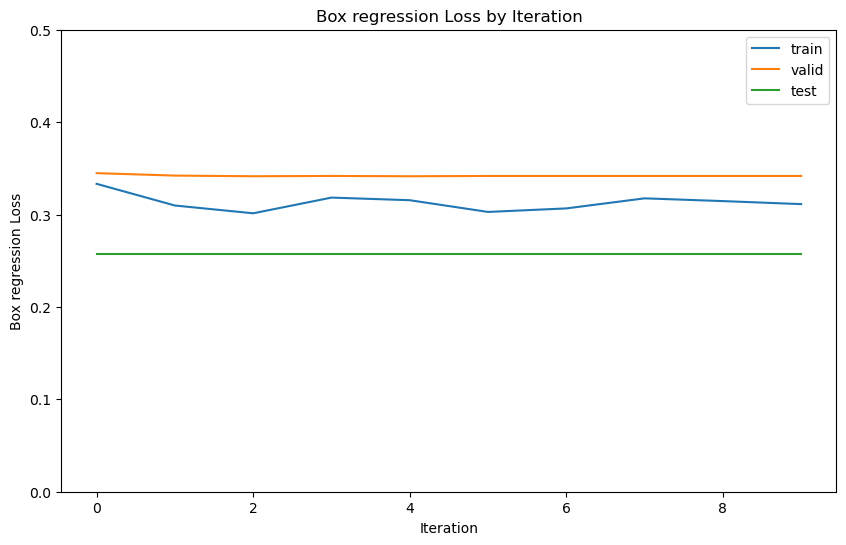

In [ ]:
%matplotlib inline
plt.figure(figsize=(10,6))
plt.xlabel('Iteration')
plt.ylabel('Box regression Loss')
plt.title('Box regression Loss by Iteration')
plt.plot(hist_train_box_reg)
plt.plot(hist_valid_box_reg)
plt.plot(test_loss_dict_t['loss_box_reg'].item()*np.ones(len(hist_valid_classifier)))
plt.ylim((0,0.5))
plt.legend(['train', 'valid', 'test'])

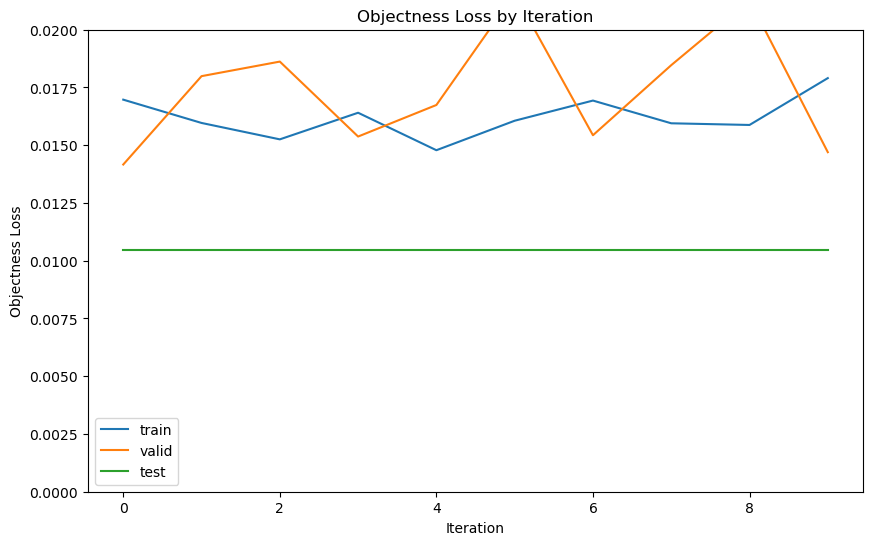

In [ ]:
%matplotlib inline
plt.figure(figsize=(10,6))
plt.xlabel('Iteration')
plt.ylabel('Objectness Loss')
plt.title('Objectness Loss by Iteration')
plt.plot(hist_train_objectness)
plt.plot(hist_valid_objectness)
plt.plot(test_loss_dict_t['loss_objectness'].item()*np.ones(len(hist_valid_classifier)))
plt.ylim((0.0,0.02))
plt.legend(['train', 'valid', 'test'])

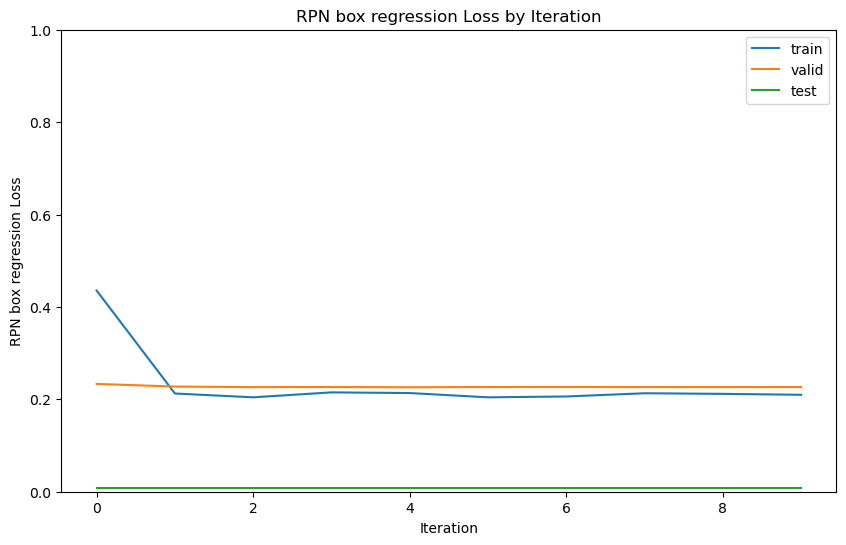

In [ ]:
%matplotlib inline
plt.figure(figsize=(10,6))
plt.xlabel('Iteration')
plt.ylabel('RPN box regression Loss')
plt.title('RPN box regression Loss by Iteration')
plt.plot(hist_train_classifier)
plt.plot(hist_valid_classifier)
plt.plot(test_loss_dict_t['loss_rpn_box_reg'].item()*np.ones(len(hist_valid_classifier)))
plt.ylim((0,1))
plt.legend(['train', 'valid', 'test'])

# Inference

In [ ]:
# set to evaluation mode
model.eval()
CLASS_NAMES = ['__background__', 'pedestrian']
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
img = Image.open('pedestrian.jpg')
transform = Tv.Compose([Tv.ToTensor()])
img = transform(img)

img = img.to(device)
pred = model([img])
pred_score = list(pred[0]['scores'].detach().cpu().numpy())

Let's see what a prediction contains:

In [ ]:
pred

[{'boxes': tensor([[ 253.0314,   89.9681,  464.8344,  720.5812],
          [ 800.7367,  118.9290,  957.1618,  697.5267],
          [ 531.7713,  124.6439,  685.5594,  640.2174],
          [1033.5170,  178.2807, 1161.6017,  514.7468],
          [1162.8380,  166.2858, 1250.6514,  478.9891],
          [ 713.1462,  267.7934,  743.4979,  376.0863],
          [ 565.9537,  257.6975,  667.6030,  650.4163],
          [ 740.9141,  238.7492,  785.5943,  383.5517],
          [ 214.8191,    0.0000,  434.2260,  549.5967],
          [ 313.5478,  255.0725,  473.9992,  779.6089],
          [ 181.0575,  227.1988,  447.4614,  642.3152],
          [ 963.9742,  228.7379, 1214.2941,  566.7974],
          [ 540.9644,  237.6420,  629.6576,  666.8389],
          [ 775.3983,  163.5735, 1001.2757,  513.2247],
          [ 839.8116,  263.9240,  943.1277,  641.9752],
          [ 980.1354,   49.1440, 1176.7577,  515.7949],
          [ 824.8302,  291.4395, 1007.5831,  738.9853],
          [1085.8632,  140.4153, 1184.7

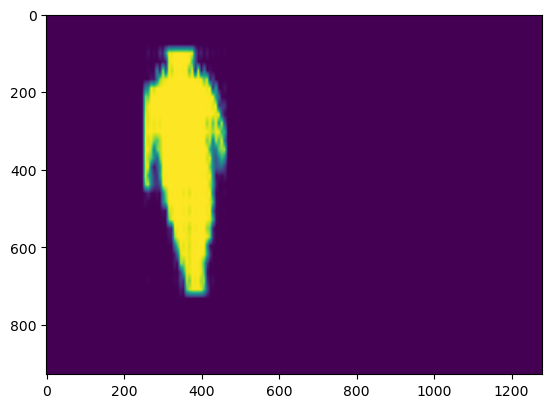

In [ ]:
plt.imshow(np.squeeze(pred[0]['masks'].detach().cpu().numpy()[0,:,:], axis=0))

# Try Different images from the internet

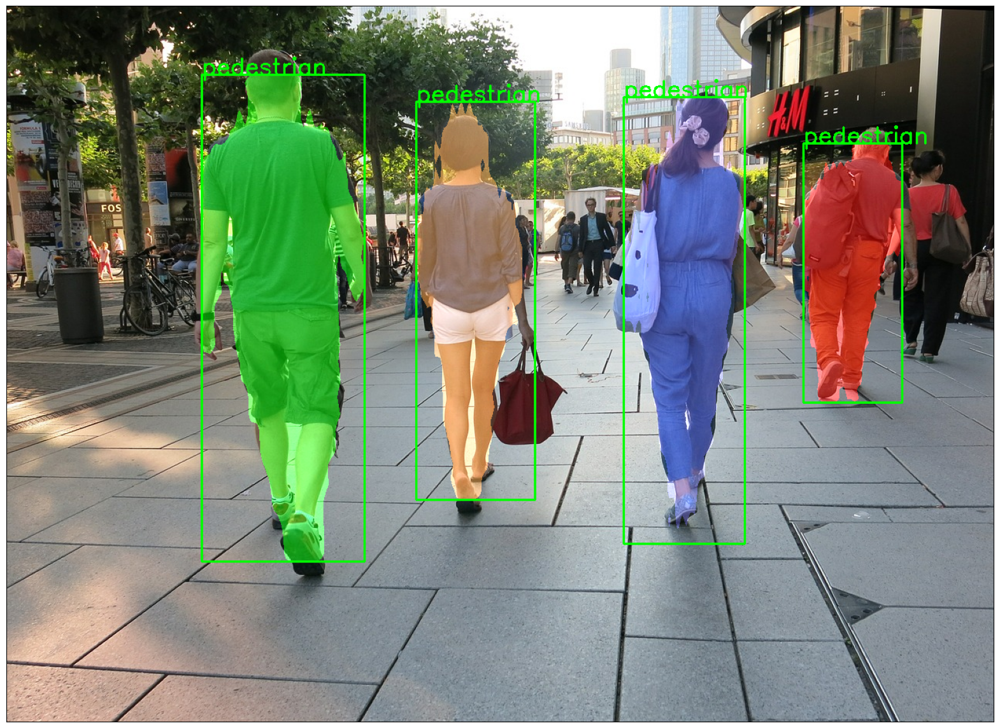

In [ ]:
segment_instance('pedestrian.jpg', CLASS_NAMES=CLASS_NAMES, model=model, confidence=0.2)

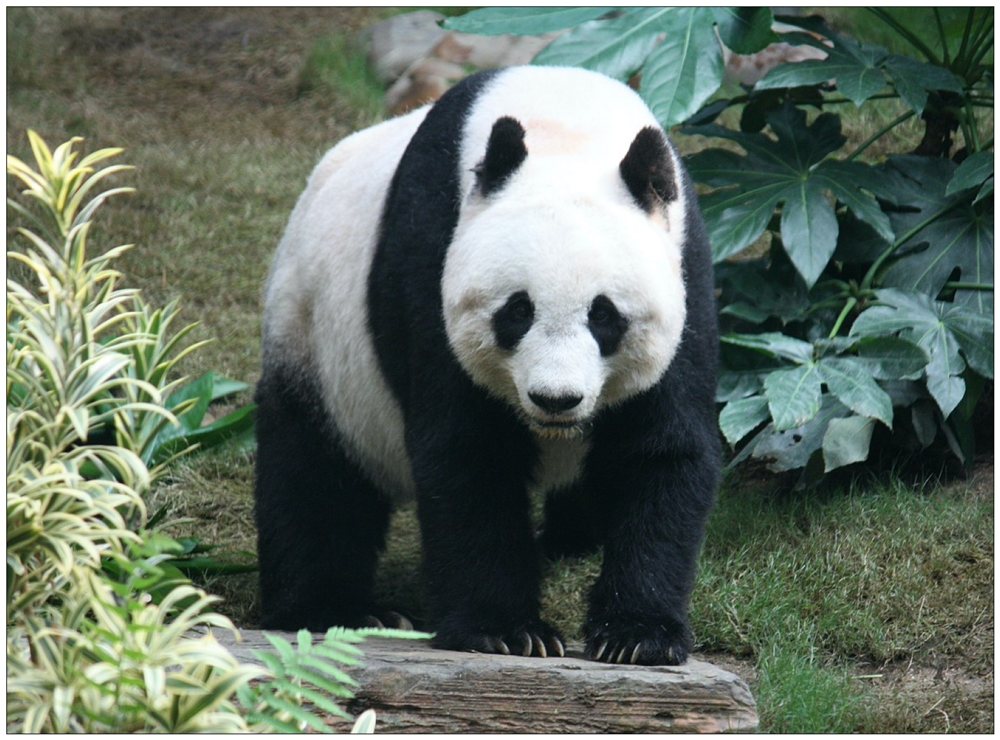

In [ ]:
segment_instance('panda.jpg', CLASS_NAMES=CLASS_NAMES, model=model, confidence=0.2)

100%|█████████████████████████████████████████████████████████████████████████████| 3.12M/3.12M [00:00<00:00, 9.26MB/s]


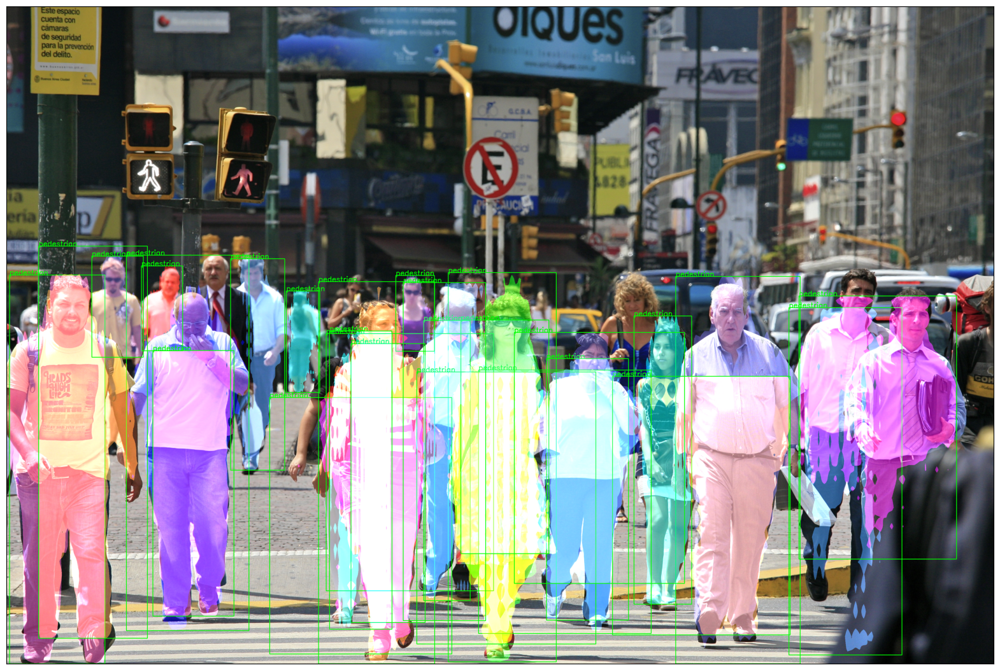

In [ ]:
torch.hub.download_url_to_file('https://upload.wikimedia.org/wikipedia/commons/9/97/CrossWalk_%285465840138%29.jpg', 'pedestrian2.jpg')
segment_instance('pedestrian2.jpg', CLASS_NAMES=CLASS_NAMES, model=model, confidence=0.1)

100%|███████████████████████████████████████████████████████████████████████████████| 168k/168k [00:00<00:00, 10.4MB/s]


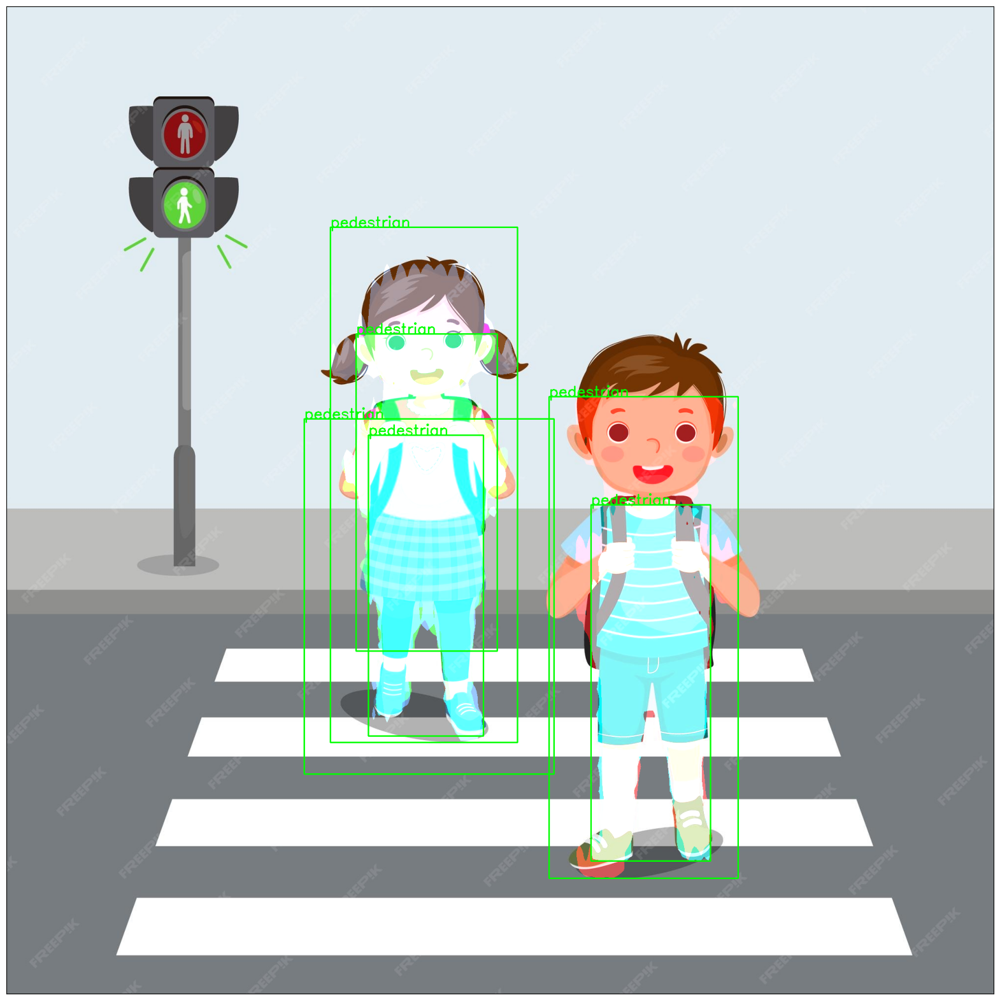

In [ ]:
torch.hub.download_url_to_file('https://img.freepik.com/premium-vector/school-kids-with-backpack-walking-crossing-road-near-pedestrian-traffic-light-zebra-cross_535862-475.jpg?w=2000', 'pedestrian3.jpg')
segment_instance('pedestrian3.jpg', CLASS_NAMES=CLASS_NAMES, model=model, confidence=0.1)